Adi Peled 204818678

Project : Body Performance


# Intro

## **2,3)  Load the csv into a data frame + types of cols**

In [40]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/gdrive')

bodyPerformanceSource = pd.read_csv('/gdrive/MyDrive/Colab Notebooks/FinalWork/bodyPerformance.csv')


Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [41]:
pd.set_option('max_columns', 12)
pd.set_option('max_rows', 20)


In [42]:
bodyPerformanceSource.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [43]:
bodyPerformanceSource.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


## **4) Size of data set**




In [44]:
bodyPerformanceSource.shape

(13393, 12)

## **5) Quantity of lacks**

In [45]:
bodyPerformanceSource.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


In [46]:
bodyPerformanceSource.isnull().sum()


age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

# Initial Data Analysis


## **1) Feature statistical analysis**

In [47]:
bodyPerformanceSource.describe().T

,count,mean,std,min,25%,50%,75%,max
age,13393.0,36.775106,13.625639,21.0,25.0,32.0,48.0,64.0
height_cm,13393.0,168.559807,8.426583,125.0,162.4,169.2,174.8,193.8
weight_kg,13393.0,67.447316,11.949666,26.3,58.2,67.4,75.3,138.1
body fat_%,13393.0,23.240165,7.256844,3.0,18.0,22.8,28.0,78.4
diastolic,13393.0,78.796842,10.742033,0.0,71.0,79.0,86.0,156.2
systolic,13393.0,130.234817,14.713954,0.0,120.0,130.0,141.0,201.0
gripForce,13393.0,36.963877,10.624864,0.0,27.5,37.9,45.2,70.5
sit and bend forward_cm,13393.0,15.209268,8.456677,-25.0,10.9,16.2,20.7,213.0
sit-ups counts,13393.0,39.771224,14.276698,0.0,30.0,41.0,50.0,80.0
broad jump_cm,13393.0,190.129627,39.868000,0.0,162.0,193.0,221.0,303.0


In [48]:
bodyPerformanceSource.describe(include='object').T


,count,unique,top,freq
gender,13393,2,M,8467
class,13393,4,D,3349


## **2) Summary of data fixes**

In [49]:
bodyPerformance=bodyPerformanceSource.copy()

### a) Change columns type from 'object' to 'category'for 'gender' and 'class' cols: 

In [50]:
def changeTypeColFromObjecctToCategory(df,colName,categoriesValues,isOrdered):
  """the function get dataframe,col name , categories Values and if the values are having order and return copy series in category type"""
  return pd.Categorical(df[colName], ordered=isOrdered, categories=categoriesValues)
 
bodyPerformance['gender'] = changeTypeColFromObjecctToCategory(bodyPerformance,"gender",['M', 'F'],False);
bodyPerformance['class'] = changeTypeColFromObjecctToCategory(bodyPerformance,"class",['D', 'C', 'B','A'],True);

# for source data in order to use in the prediciton part
bodyPerformanceSource['gender'] = changeTypeColFromObjecctToCategory(bodyPerformanceSource,"gender",['M', 'F'],False);
bodyPerformanceSource['class'] = changeTypeColFromObjecctToCategory(bodyPerformanceSource,"class",['D', 'C', 'B','A'],True);

### b) change values in some columns from 0 to the column's median

Check how many 0 every column has: 

In [51]:
(bodyPerformanceSource[['systolic', 'diastolic','gripForce','sit-ups counts', 'broad jump_cm']]== 0).astype(int).sum(axis=0)


systolic            1
diastolic           1
gripForce           3
sit-ups counts    125
broad jump_cm      10
dtype: int64

chack 0 in his on 'sit-ups counts' cols:



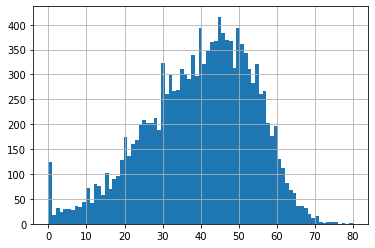

In [52]:
bodyPerformanceSource['sit-ups counts'].hist(bins=81)

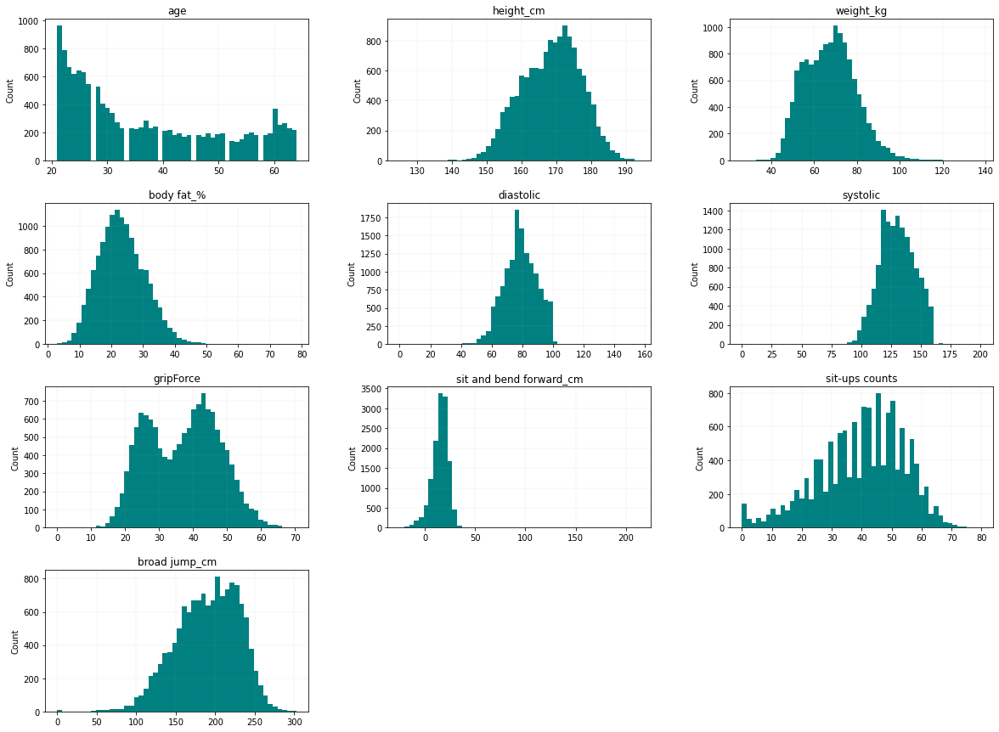

In [53]:
histogramas = bodyPerformance.hist(bins=50, figsize=(20, 15) ,color='teal')  

for idx, ax in enumerate(histogramas.flatten()):
    ax.set_ylabel("Count")
    ax.grid(linewidth='0.1')

plt.show()

replace 0 by median in 5 cols:

In [54]:
features_with_0_value = ['gripForce','sit-ups counts', 'broad jump_cm','systolic','diastolic']
for feature in features_with_0_value: 
  bodyPerformance.replace(0,bodyPerformance.mean(axis=0),inplace=True)

### c) convert type float to int to columns that are not have decimal value (after . ) 

In [55]:
features_to_int = ['sit-ups counts', 'broad jump_cm','systolic','diastolic']
for feature in features_to_int: 
    bodyPerformance[feature] = bodyPerformance[feature].astype(int)

### d) check & remove blatant outliers from features (from specific classes a b c)

In [56]:
def createBoxPlots_feature(df,features):
  """function get dataframe and list of features and create for every feature boxplot"""
  plt.figure(figsize=[24, 24])
  counter=1
  for feature in features:
     plt.subplot(4, 4, counter)
     sns.boxplot(x=feature, data=df,palette="rocket")
     counter+=1
        


Checking blatant outliers for all features:

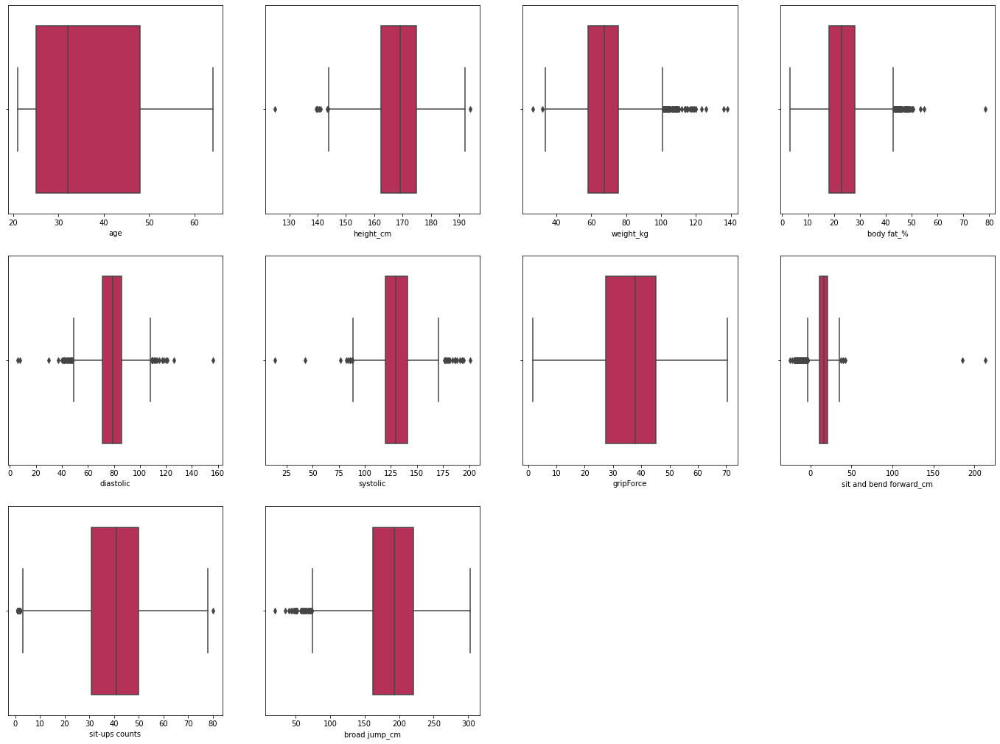

In [57]:
features_to_check_outliers = [ 'age','height_cm', 'weight_kg', 'body fat_%', 'diastolic',
       'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts','broad jump_cm']

createBoxPlots_feature(bodyPerformance,features_to_check_outliers);

In [58]:
bodyPerformance.shape

(13393, 12)

Removing outliers from all classes and after:

In [59]:
def remove_outliers(df,features_to_remove_outliers,isAllClasses):
    """function get dataframe and list of features and remove outliers from every feature , if isAllClasses=1 ouliers will removed from all classes else: classes will removed only from  A B C classes """
    for feature in features_to_remove_outliers:
      p25 = df[feature].quantile(0.25)
      p75 = df[feature].quantile(0.75)  
      iqr = p75 - p25
      lower_limit = p25 - 1.5*iqr
      upper_limit = p75 + 1.5*iqr
      if isAllClasses:
        df = df[(df[feature] > lower_limit) & (df[feature] < upper_limit)]
      else:
        df = df[((df[feature] > lower_limit) & (df[feature] < upper_limit) ) | (df['class']== "D")]

    return df;

features_to_remove_outliers = [ 'diastolic', 'systolic', 'body fat_%', 'weight_kg',
       'height_cm', 'sit and bend forward_cm', 'sit-ups counts','broad jump_cm']

bodyPerformance_clean_all_outliers=remove_outliers(bodyPerformance,features_to_remove_outliers,True);


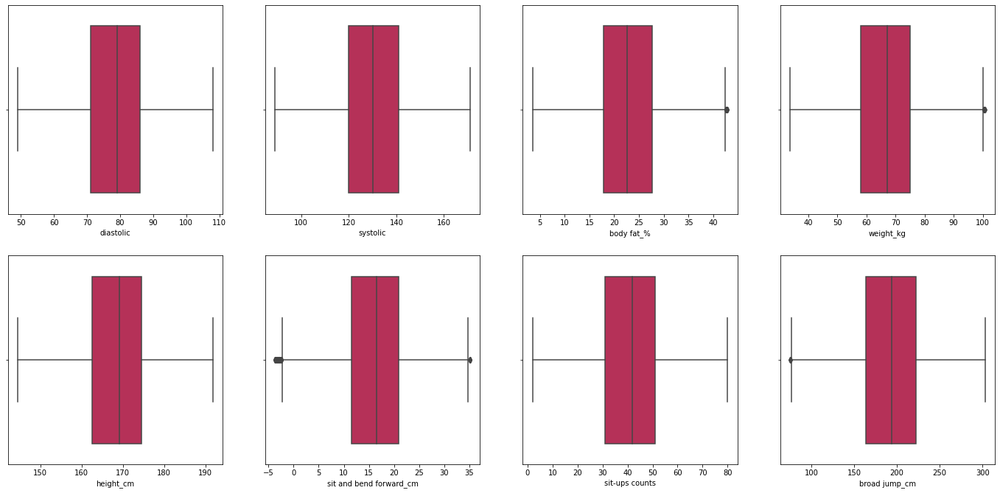

In [60]:
createBoxPlots_feature(bodyPerformance_clean_all_outliers,features_to_remove_outliers);

In [61]:
bodyPerformance.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000
mean,36.775106,168.559807,67.447316,23.240165,78.802583,130.244456,36.972157,15.222896,40.135145,190.271485
std,13.625639,8.426583,11.949666,7.256844,10.720358,14.671247,10.610447,8.444402,13.745460,39.527754
min,21.000000,125.000000,26.300000,3.000000,6.000000,14.000000,1.600000,-25.000000,1.000000,20.000000
25%,25.000000,162.400000,58.200000,18.000000,71.000000,120.000000,27.500000,10.900000,31.000000,162.000000
50%,32.000000,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.200000,41.000000,193.000000
75%,48.000000,174.800000,75.300000,28.000000,86.000000,141.000000,45.200000,20.700000,50.000000,221.000000
max,64.000000,193.800000,138.100000,78.400000,156.000000,201.000000,70.500000,213.000000,80.000000,303.000000


In [62]:
bodyPerformance_clean_all_outliers.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,12717.000000,12717.000000,12717.000000,12717.000000,12717.000000,12717.000000,12717.000000,12717.000000,12717.000000,12717.000000
mean,36.662578,168.524951,67.021409,22.937001,78.782889,130.189825,37.070916,16.007798,40.611937,191.493670
std,13.569631,8.280444,11.403543,6.975733,10.424716,14.361776,10.574119,6.961553,13.532980,38.604432
min,21.000000,144.500000,33.700000,3.500000,49.000000,89.000000,1.600000,-3.700000,2.000000,75.000000
25%,25.000000,162.500000,58.000000,17.900000,71.000000,120.000000,27.600000,11.600000,31.000000,164.000000
50%,32.000000,169.100000,67.200000,22.600000,79.000000,130.000000,38.000000,16.500000,42.000000,194.000000
75%,48.000000,174.600000,74.900000,27.700000,86.000000,141.000000,45.300000,20.900000,51.000000,222.000000
max,64.000000,191.800000,100.800000,42.900000,108.000000,171.000000,70.500000,35.200000,80.000000,303.000000


Text(0.5, 1.0, 'Class counts after removing outliers from all classes')

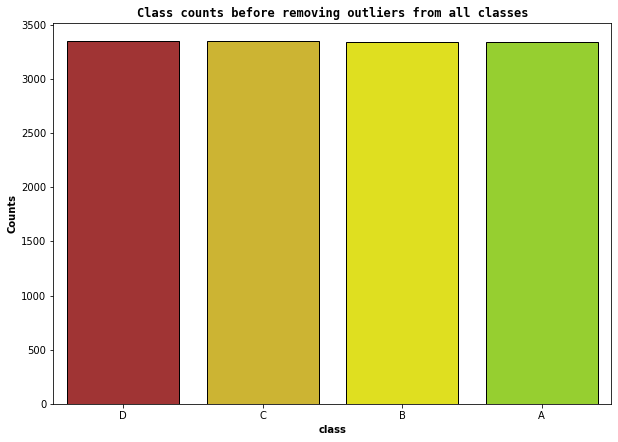

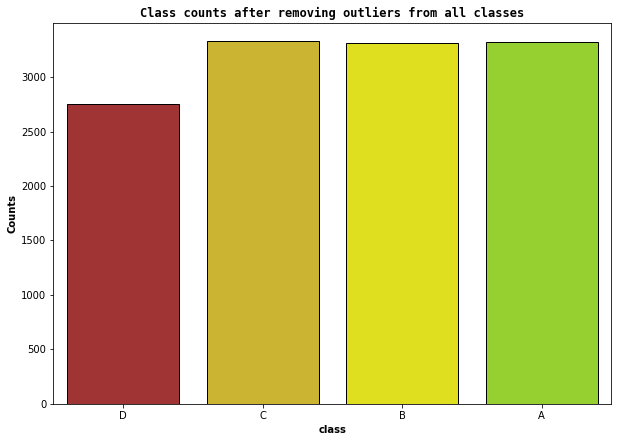

In [63]:
fig = plt.figure(figsize=(10,7))
g=sns.barplot(x=bodyPerformance['class'].value_counts().index,y=bodyPerformance['class'].value_counts().values,palette = ['#b22222','#e6c619','#ffff00','#9dea15'],edgecolor='black')
plt.xlabel('class',weight = 'semibold')
plt.ylabel('Counts',weight = 'semibold')
plt.title('Class counts before removing outliers from all classes',fontname='monospace',weight = 'bold')

fig = plt.figure(figsize=(10,7))
g=sns.barplot(x=bodyPerformance_clean_all_outliers['class'].value_counts().index,y=bodyPerformance_clean_all_outliers['class'].value_counts().values,palette = ['#b22222','#e6c619','#ffff00','#9dea15'],edgecolor='black')
plt.xlabel('class',weight = 'semibold')
plt.ylabel('Counts',weight = 'semibold')
plt.title('Class counts after removing outliers from all classes',fontname='monospace',weight = 'bold')

In [64]:
bodyPerformanceSource.shape

(13393, 12)

In [65]:
bodyPerformance_clean_all_outliers.shape

(12717, 12)

In [66]:
bodyPerformance.groupby(['class']).count()['age']

class
D    3349
C    3349
B    3347
A    3348
Name: age, dtype: int64

In [67]:
bodyPerformance_clean_all_outliers.groupby(['class']).count()['age']

class
D    2756
C    3328
B    3315
A    3318
Name: age, dtype: int64

removing outliers from classes:  A B C

In [68]:
bodyPerformance_clean_abc_outliers=remove_outliers(bodyPerformance,features_to_remove_outliers,False);



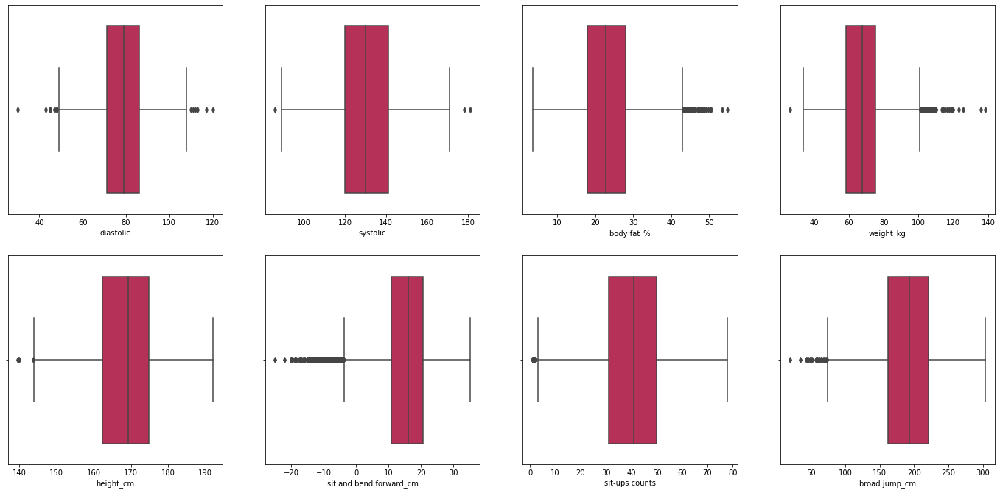

In [69]:
createBoxPlots_feature(bodyPerformance_clean_abc_outliers,features_to_remove_outliers);


Text(0.5, 1.0, 'Class counts after removing outliers from classes: A B C ')

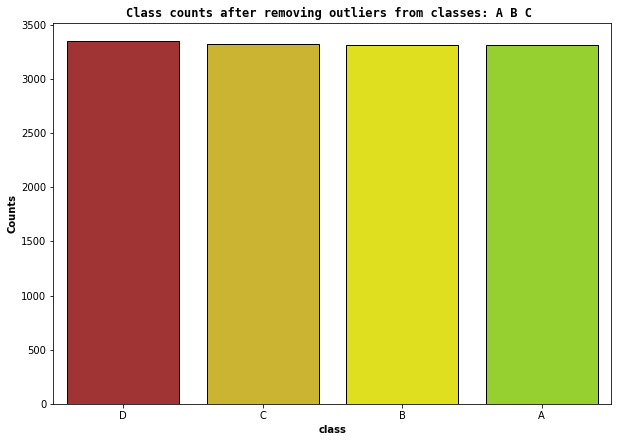

In [70]:
fig = plt.figure(figsize=(10,7))
g=sns.barplot(x=bodyPerformance_clean_abc_outliers['class'].value_counts().index,y=bodyPerformance_clean_abc_outliers['class'].value_counts().values,palette = ['#b22222','#e6c619','#ffff00','#9dea15'],edgecolor='black')
plt.xlabel('class',weight = 'semibold')
plt.ylabel('Counts',weight = 'semibold')
plt.title('Class counts after removing outliers from classes: A B C ',fontname='monospace',weight = 'bold')


In [71]:
bodyPerformance_clean_abc_outliers.groupby(['class']).count()['age']

class
D    3349
C    3328
B    3315
A    3317
Name: age, dtype: int64

In [72]:
bodyPerformance_clean_abc_outliers.shape

(13309, 12)

In [73]:
bodyPerformance=bodyPerformance_clean_abc_outliers

### e) add bmi coulmn

In [74]:
bodyPerformance['bmi']=(bodyPerformance['weight_kg'])/((bodyPerformance['height_cm']/100)**2)
bodyPerformance['bmi']=bodyPerformance['bmi'].round(2)
bodyPerformance['bmi_cat'] = pd.cut(bodyPerformance['bmi'],bins=[0,18.5,25,43],labels=["underWeight","normalWeight","overWeight"], retbins=False,include_lowest=True)
bodyPerformance['bmi_cat'] = changeTypeColFromObjecctToCategory(bodyPerformance,"bmi_cat",['underWeight', "normalWeight","overWeight"],True);


In [75]:
bodyPerformance['bmi_cat'].value_counts()

normalWeight    9190
overWeight      3781
underWeight      338
Name: bmi_cat, dtype: int64

In [76]:
bodyPerformance.shape

(13309, 14)

In [77]:
bodyPerformance

,age,gender,height_cm,weight_kg,body fat_%,diastolic,...,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,bmi,bmi_cat
0,27.0,M,172.3,75.24,21.3,80,...,18.4,60,217,C,25.34,overWeight
1,25.0,M,165.0,55.80,15.7,77,...,16.3,53,229,A,20.50,normalWeight
2,31.0,M,179.6,78.00,20.1,92,...,12.0,49,181,C,24.18,normalWeight
3,32.0,M,174.5,71.10,18.4,76,...,15.2,53,219,B,23.35,normalWeight
4,28.0,M,173.8,67.70,17.1,70,...,27.1,45,217,B,22.41,normalWeight
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,M,172.1,71.80,16.2,74,...,17.4,47,198,C,24.24,normalWeight
13389,21.0,M,179.7,63.90,12.1,74,...,1.1,48,167,D,19.79,normalWeight
13390,39.0,M,177.2,80.50,20.1,78,...,16.4,45,229,A,25.64,overWeight
13391,64.0,F,146.1,57.70,40.4,68,...,9.2,39,75,D,27.03,overWeight


In [138]:
path = 'bodyPerformance_manipulated_after_section_2.csv'
bodyPerformance.to_csv(path,index= False)

# Exploratory Data Analysis

## **Feature corelation**

### a) corr matrix and scatter matrix

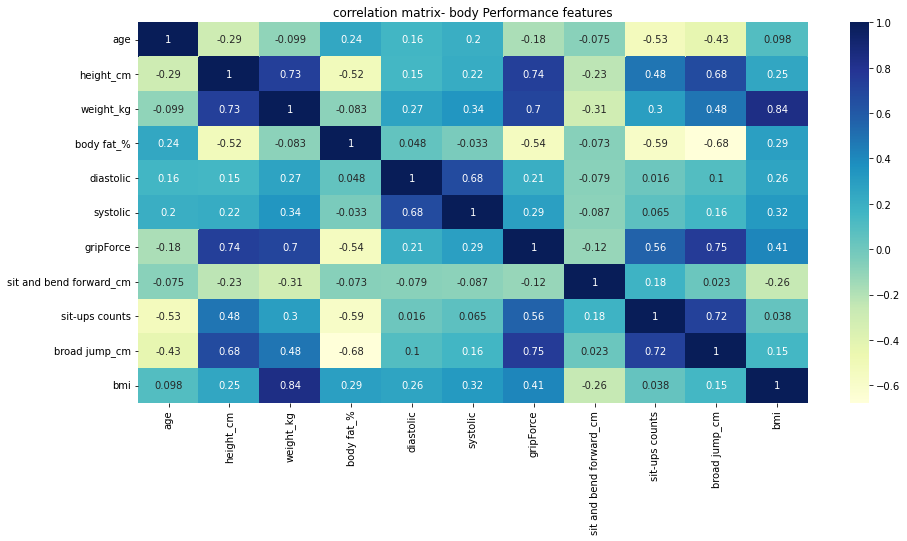

In [79]:
fig, ax = plt.subplots(figsize=(15,7))
corrMatrix=bodyPerformance.corr()
ax.set_title('correlation matrix- body Performance features')
sns.heatmap(corrMatrix,annot=True, ax=ax,cmap="YlGnBu")

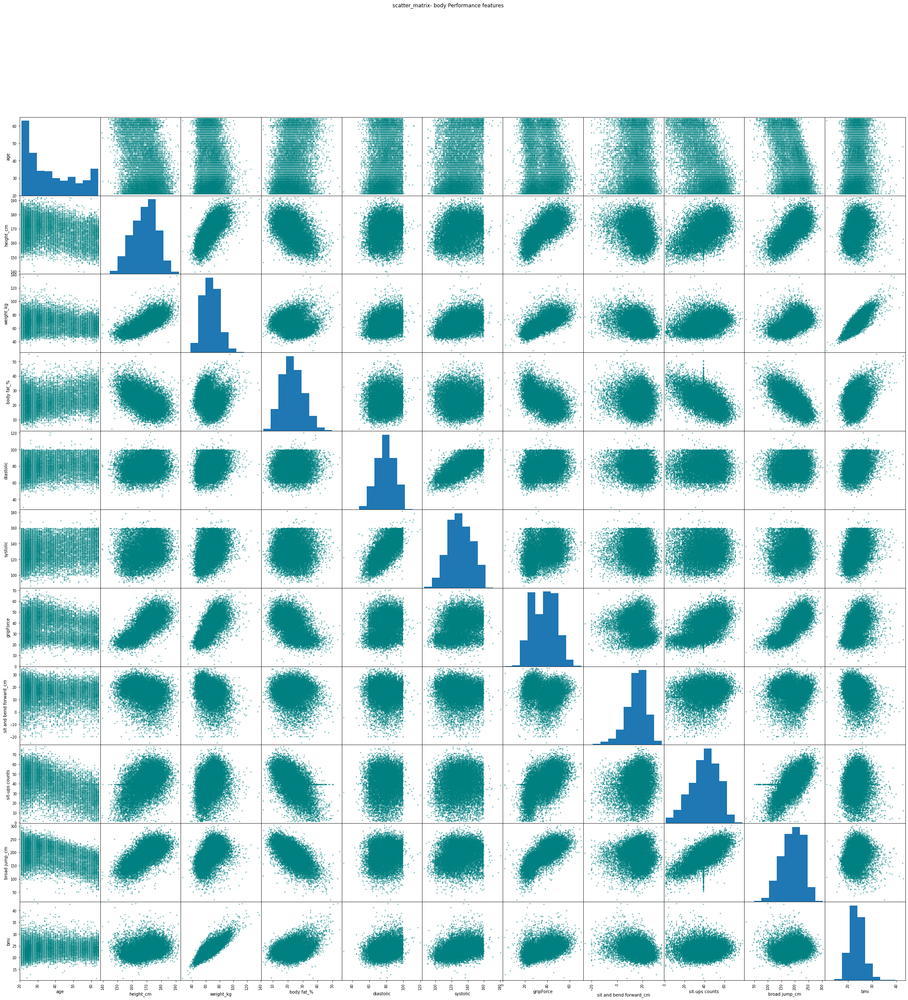

In [80]:
attributes = ['age', 'height_cm', 'weight_kg', 'body fat_%', 'diastolic',
       'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts','broad jump_cm','bmi']
pd.plotting.scatter_matrix(bodyPerformance[attributes], figsize=(37, 37),color='teal') 
plt.suptitle('scatter_matrix- body Performance features')
plt.show()

### b)categoric coralation with numeric

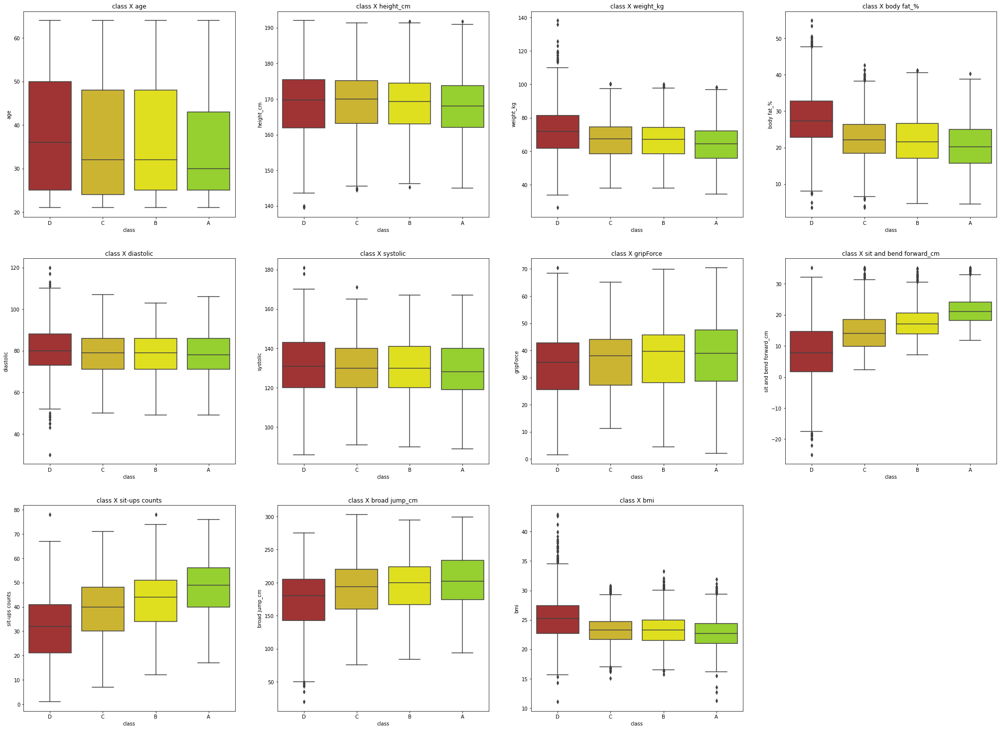

In [81]:
features = ['age','height_cm', 'weight_kg', 'body fat_%', 'diastolic',
       'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts','broad jump_cm','bmi']
       
def createBoxPlots_allFeaturesVSmainFeature(df,features,mainFeature):
  "create box plot for list of features with feature mainFeature"
  plt.figure(figsize=[35, 35])
  counter=1
  colors=[]
  if mainFeature=="class":
    colors= ['#b22222','#e6c619','#ffff00','#9dea15']
  else: 
    colors=['#0080FF','#FFAAFE']
  for feature in features:
     plt.subplot(4, 4, counter)
     sns.boxplot(x=mainFeature, y=feature, data=bodyPerformance,palette = colors)
     plt.title(mainFeature +' X '+ feature)
     counter+=1

createBoxPlots_allFeaturesVSmainFeature(bodyPerformance,features,"class");

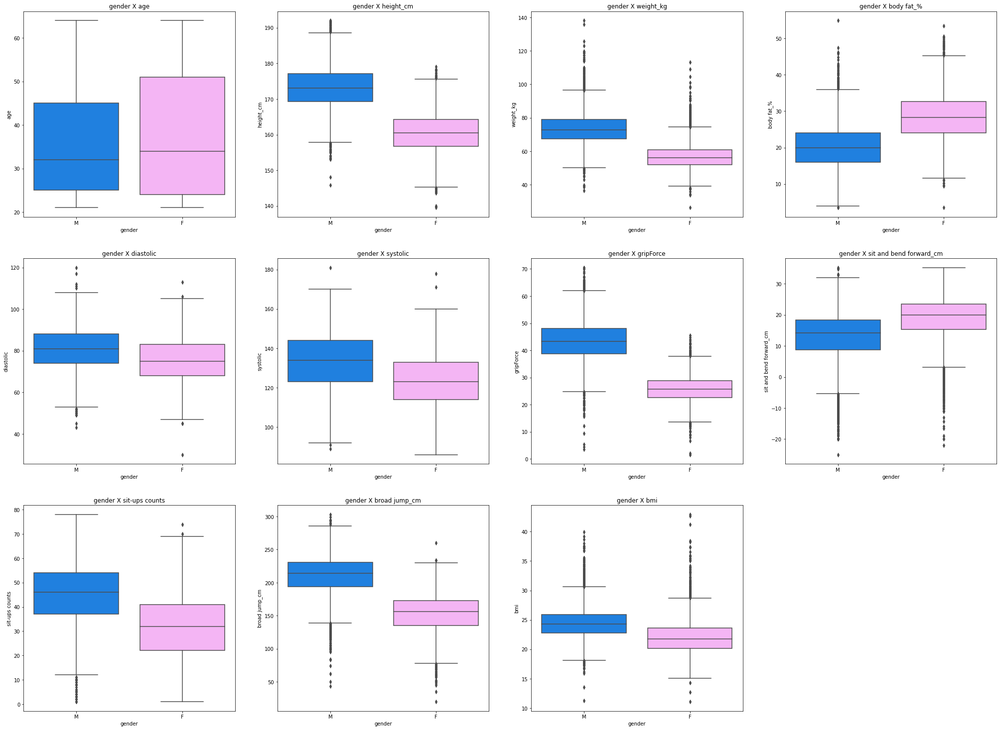

In [82]:
createBoxPlots_allFeaturesVSmainFeature(bodyPerformance,features,"gender");

## **Analysis of each feature**

### a) numeric features

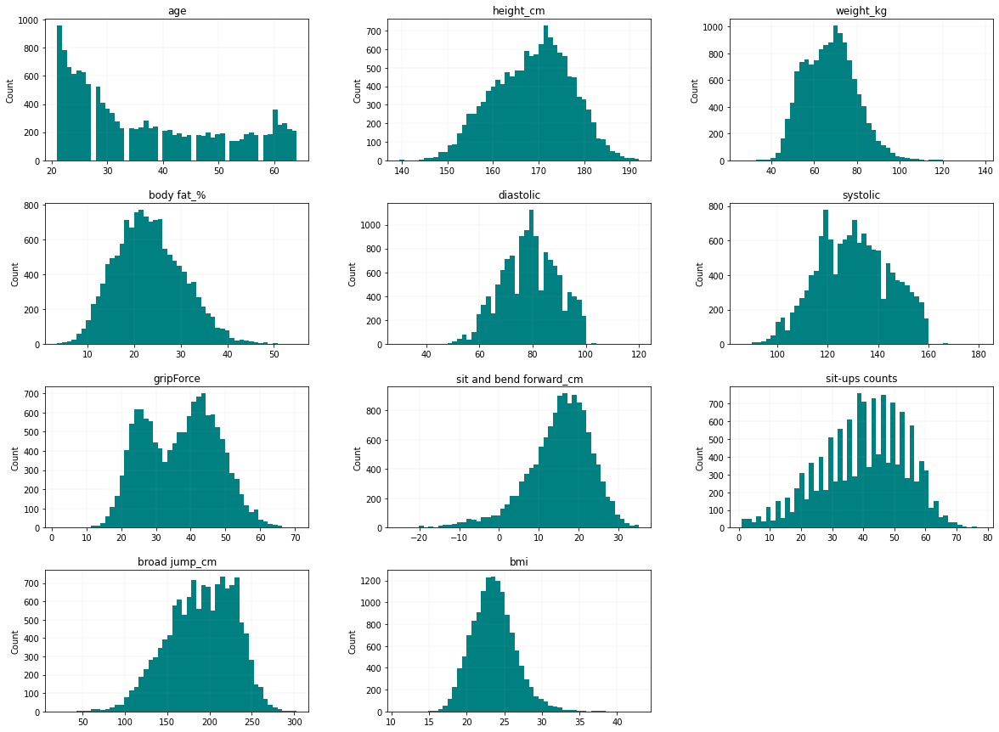

In [83]:
histogramas = bodyPerformance.hist(bins=50, figsize=(20, 15) ,color='teal')  

for idx, ax in enumerate(histogramas.flatten()):
    ax.set_ylabel("Count")
    ax.grid(linewidth='0.1')

plt.show()

 *  age

In [84]:
bodyPerformance['age_ranges'] = pd.cut(bodyPerformance['age'],bins=[20,30,40,50,60,70],labels=["20-29","30-39","40-49","50-59","60-69"], retbins=False,include_lowest=True)
bodyPerformance['age_ranges'] = changeTypeColFromObjecctToCategory(bodyPerformance,"age_ranges",["20-29","30-39","40-49","50-59","60-69"],True);

Text(0.5, 1.0, 'Counting People - Age Ranges')

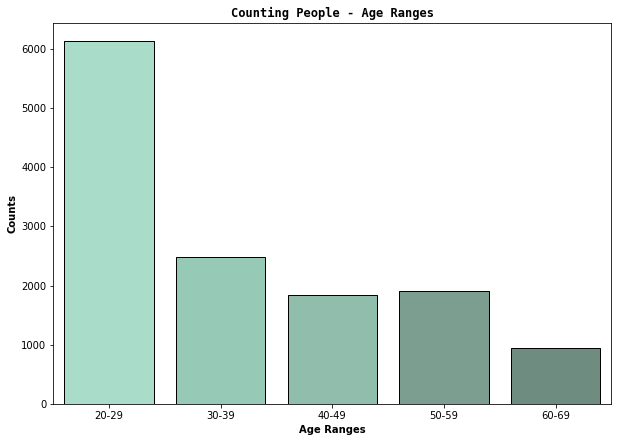

In [85]:
fig = plt.figure(figsize=(10,7))
sns.barplot(x=bodyPerformance['age_ranges'].value_counts().index,y=bodyPerformance['age_ranges'].value_counts().values,palette = ['#A1E6CB','#8FD2B8','#8AC4AE','#76A492','#699181'],edgecolor='black')
plt.xlabel('Age Ranges',weight = 'semibold')
plt.ylabel('Counts',weight = 'semibold')
plt.title('Counting People - Age Ranges',fontname='monospace',weight = 'bold') 


### Categorical features

* gender

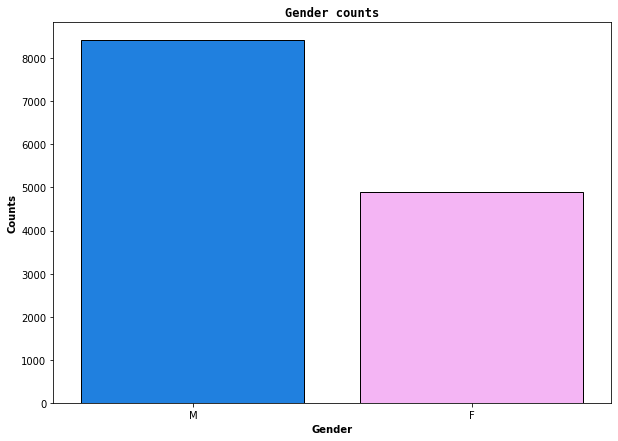

In [86]:
fig = plt.figure(figsize=(10,7))
sns.barplot(x=bodyPerformance['gender'].value_counts().index,y=bodyPerformance['gender'].value_counts().values,palette = ['#0080FF','#FFAAFE'],edgecolor='black')
plt.xlabel('Gender',weight = 'semibold')
plt.ylabel('Counts',weight = 'semibold')
plt.title('Gender counts',fontname='monospace',weight = 'bold')

filtermale=bodyPerformance['gender']=='M'
filterfemale=bodyPerformance['gender']=='F'

males=bodyPerformance[filtermale]
females=bodyPerformance[filterfemale]


In [87]:
males.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,bmi
count,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000,8416.000000
mean,36.125594,173.262001,73.569788,20.186285,80.686074,133.832818,43.444764,13.033948,44.955561,211.608365,24.475594
std,13.083389,5.794438,9.433212,5.913664,10.133011,13.272104,7.133429,7.913728,11.668899,27.908613,2.627025
min,21.000000,145.800000,36.500000,3.500000,43.000000,89.000000,3.500000,-25.000000,1.000000,43.000000,11.310000
25%,25.000000,169.300000,67.300000,16.000000,74.000000,123.000000,38.800000,8.800000,37.000000,194.000000,22.780000
50%,32.000000,173.100000,72.800000,20.000000,81.000000,134.000000,43.300000,14.200000,46.000000,214.000000,24.285000
75%,45.000000,177.100000,79.000000,24.000000,88.000000,144.000000,48.100000,18.300000,54.000000,231.000000,25.932500
max,64.000000,192.000000,138.100000,54.900000,120.000000,181.000000,70.500000,35.200000,78.000000,303.000000,39.950000


In [88]:
females.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,bmi
count,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000,4893.000000
mean,37.817699,160.522481,56.939064,28.475241,75.642959,124.051298,25.837871,18.843846,31.846311,153.684243,22.106916
std,14.397333,5.602971,7.630039,6.217572,10.389622,14.212182,4.687914,7.150364,13.058789,27.722876,2.834495
min,21.000000,139.500000,26.300000,3.500000,30.000000,86.000000,1.600000,-22.000000,1.000000,20.000000,11.100000
25%,24.000000,156.700000,52.000000,24.100000,68.000000,114.000000,22.700000,15.300000,22.000000,135.000000,20.190000
50%,34.000000,160.500000,56.000000,28.300000,75.000000,123.000000,25.700000,20.000000,32.000000,156.000000,21.740000
75%,51.000000,164.300000,61.000000,32.600000,83.000000,133.000000,28.800000,23.500000,41.000000,173.000000,23.600000
max,64.000000,179.000000,113.300000,53.500000,113.000000,178.000000,45.500000,35.200000,74.000000,260.000000,42.910000


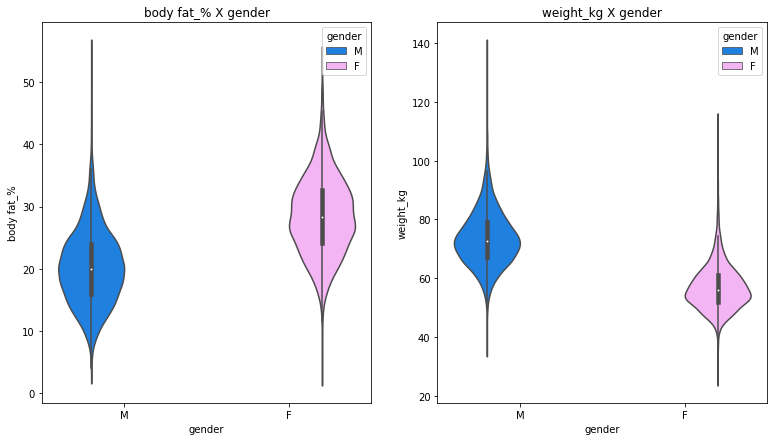

In [89]:
plt.figure(figsize=[13, 7])
plt.subplot(1, 2, 1)
g1=sns.violinplot(x='gender', y='body fat_%', data=bodyPerformance, hue='gender',palette = ['#0080FF','#FFAAFE']).set_title("body fat_% X gender")
plt.subplot(1, 2, 2)
g2=sns.violinplot(x='gender', y='weight_kg', data=bodyPerformance, hue='gender',palette = ['#0080FF','#FFAAFE']).set_title("weight_kg X gender")




* class

In [90]:
bodyPerformance.groupby(['class']).mean()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,bmi
class,,,,,,,,,,,
D,38.058226,168.625530,71.996948,27.735432,80.099731,131.123320,34.758783,7.644757,31.336817,174.161242,25.181078
C,36.659555,169.190475,66.773218,22.628168,78.563702,129.898137,36.614124,14.383404,38.757212,189.020433,23.194892
B,37.033183,168.625551,66.609107,21.994726,78.720664,130.641931,37.943196,17.395297,42.680543,195.503469,23.305762
A,35.227615,167.869460,64.400947,20.534250,77.932469,129.276153,38.593663,21.332822,47.860416,202.729273,22.723277


* bmi_cat

Text(0.5, 1.0, 'bmi groups counts')

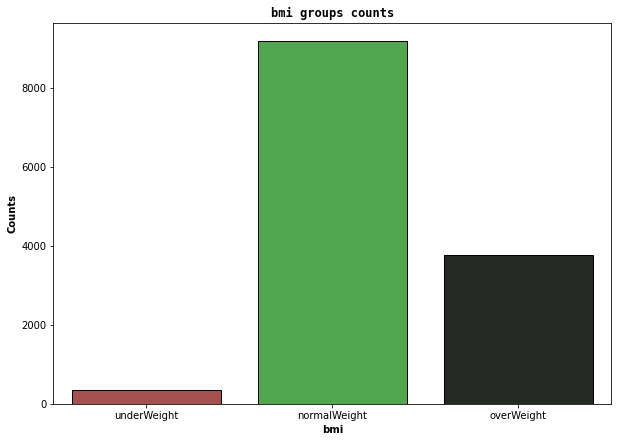

In [91]:
fig = plt.figure(figsize=(10,7))
sns.barplot(x=bodyPerformance['bmi_cat'].value_counts().index,y=bodyPerformance['bmi_cat'].value_counts().values,palette = ['#B44141','#44B441','#242A23'],edgecolor='black')
plt.xlabel('bmi',weight = 'semibold')
plt.ylabel('Counts',weight = 'semibold')
plt.title('bmi groups counts',fontname='monospace',weight = 'bold')

## **Visualization for relevant and interesting features**

### **a) class X gender**

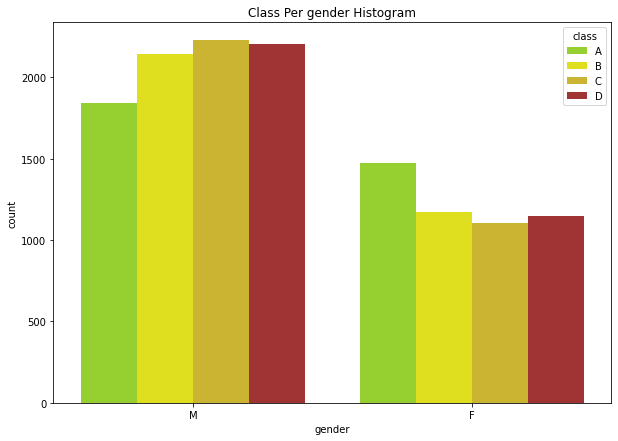

In [92]:
hue_order = ['A', 'B', 'C','D']
fig = plt.figure(figsize=(10,7))
ax = sns.countplot(x="gender", hue="class", data=bodyPerformance,palette = ['#9dea15','#ffff00','#e6c619','#b22222'],hue_order=hue_order).set_title("Class Per gender Histogram")


In [93]:
bodyPerformance.groupby(['gender','class']).aggregate('mean')

age   height_cm  weight_kg  body fat_%  diastolic  \
gender class                                                            
M      D      35.734574  173.561162  77.974492   24.794975  82.156987   
       C      35.574573  173.579245  72.239879   19.577516  80.184636   
       B      36.988811  172.902704  72.197310   18.941704  80.376690   
       A      36.254210  172.938892  71.503726   16.855048  79.891907   
F      D      42.531004  159.124978  60.490830   33.395492  76.139738   
       C      38.851180  160.325318  55.730762   28.790376  75.289474   
       B      37.114530  160.784103  56.364068   27.591932  75.684615   
       A      33.947154  161.546409  55.541721   25.123281  75.488482   

                systolic  gripForce  sit and bend forward_cm  sit-ups counts  \
gender class                                                                   
M      D      134.342105  40.692559                 5.557316       36.508621   
       C      133.148697  42.469561                12.671631       44.081761   
       B      133.989277  44.283074                15.708559       47.560373   
       A      133.868007  46.942042                19.306611       53.089625   
F      D      124.927511  23.336912                11.662854       21.381659   
       C      123.332123  24.786352                17.841125       28.001815   
       B      124.505128  26.320085                20.487650       33.734188   
       A      123.548780  28.180813                23.860095       41.338076   

              broad jump_cm        bmi  
gender class                            
M      D         196.148820  25.844120  
       C         209.397125  23.944802  
       B         215.724476  24.129161  
       A         227.994025  23.882662  
F      D         131.837555  23.904795  
       C         147.860254  21.680100  
       B         158.431624  21.796197  
       A         171.216802  21.277188

In [94]:
bodyPerformance.groupby(['gender','class']).aggregate('count')['age']

gender  class
M       D        2204
        C        2226
        B        2145
        A        1841
F       D        1145
        C        1102
        B        1170
        A        1476
Name: age, dtype: int64

In [95]:
bodyPerformance.shape

(13309, 15)

### **b) weight X bodyfat X sit-ups**

In [96]:
# press yellow and orange dots to remove classes b c from the view.

import plotly.express as px
px.scatter_3d(bodyPerformance, x="weight_kg", y="body fat_%", z="sit-ups counts", 
              color="class", color_discrete_map = {"A": "green", "B": "yellow", "orange":"D", "D":"red"})



### **c) class X  2 sports exercises**

excersice 1: broad jump

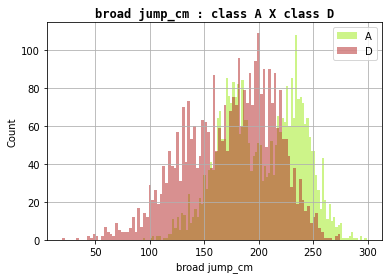

In [97]:
def compareTwoClassesHist(df,feature,class1,class2,color1,color2):
     "get feature and 2 class and their colors and show their results in hisograma"
     df[feature][df['class'] ==class1].hist(bins=100,alpha=0.5,color =color1)
     df[feature][df['class'] ==class2].hist(bins=100,alpha=0.5,color = color2)
     plt.xlabel(feature)
     plt.ylabel("Count")
     plt.title(f"{feature} : class {class1} X class {class2}",fontname='monospace',weight = 'bold')
     plt.legend([class1, class2])

compareTwoClassesHist(bodyPerformance,'broad jump_cm',"A","D","#9dea15","#b22222")


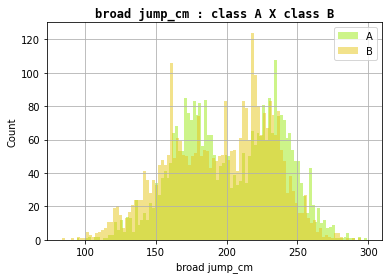

In [98]:
compareTwoClassesHist(bodyPerformance,'broad jump_cm',"A","B","#9dea15","#e6c619")

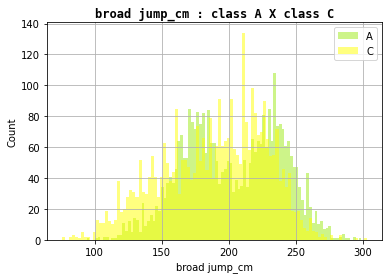

In [99]:
compareTwoClassesHist(bodyPerformance,'broad jump_cm',"A","C","#9dea15","#ffff00")

excersice 2: sit ups

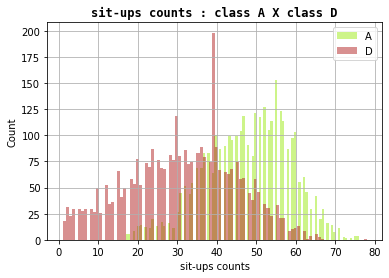

In [100]:
compareTwoClassesHist(bodyPerformance,'sit-ups counts',"A","D","#9dea15","#b22222")


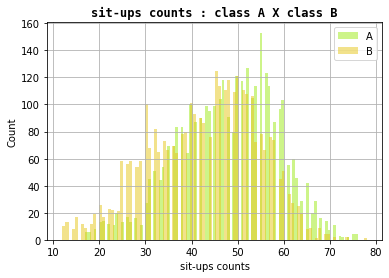

In [101]:
compareTwoClassesHist(bodyPerformance,'sit-ups counts',"A","B","#9dea15","#e6c619")

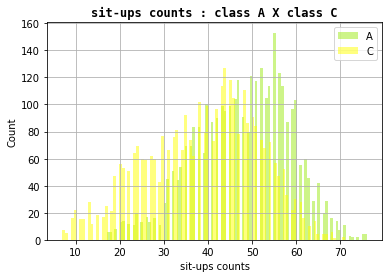

In [102]:
compareTwoClassesHist(bodyPerformance,'sit-ups counts',"A","C","#9dea15","#ffff00")

### **d) body fat x broad jump x sit-ups x gripForce with ages ranges**

In [103]:
bodyPerformance.keys()

Index(['age', 'gender', 'height_cm', 'weight_kg', 'body fat_%', 'diastolic',
       'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts',
       'broad jump_cm', 'class', 'bmi', 'bmi_cat', 'age_ranges'],
      dtype='object')

Text(0.5, 0.98, 'body fat x broad jump x sit-ups x gripForce')

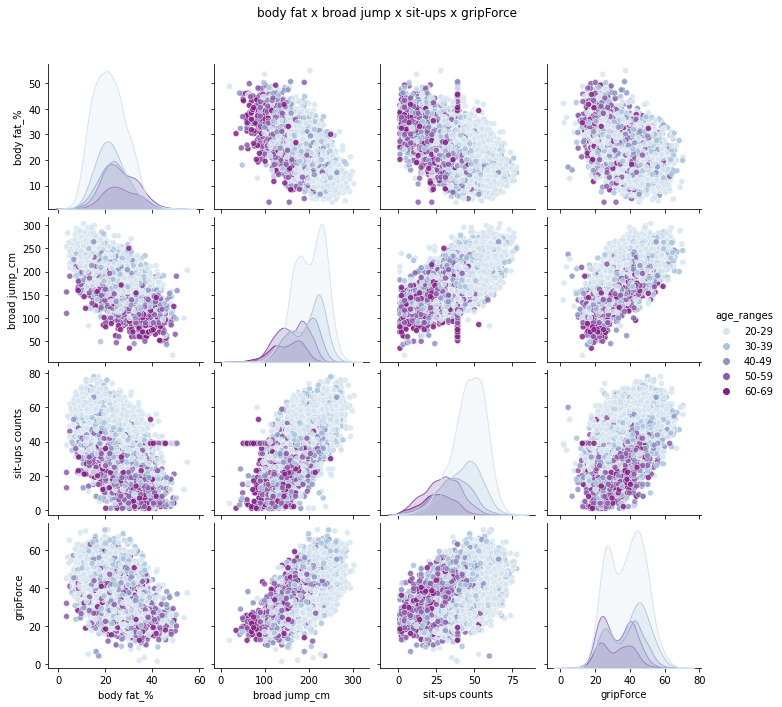

In [104]:
pairPlot =sns.pairplot(bodyPerformance, vars=['body fat_%',"broad jump_cm","sit-ups counts",'gripForce'],hue="age_ranges",height=2.5, palette='BuPu',plot_kws=dict(
    alpha=0.85))
pairPlot.fig.subplots_adjust(top=0.9)
pairPlot.fig.suptitle('body fat x broad jump x sit-ups x gripForce')


## **Additional data cleansing performed based on deeper data exploration**


In [106]:
bodyPerformance=bodyPerformance.drop(['bmi', 'bmi_cat'], axis=1)


In [107]:
bodyPerformance

,age,gender,height_cm,weight_kg,body fat_%,diastolic,...,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,age_ranges
0,27.0,M,172.3,75.24,21.3,80,...,54.9,18.4,60,217,C,20-29
1,25.0,M,165.0,55.80,15.7,77,...,36.4,16.3,53,229,A,20-29
2,31.0,M,179.6,78.00,20.1,92,...,44.8,12.0,49,181,C,30-39
3,32.0,M,174.5,71.10,18.4,76,...,41.4,15.2,53,219,B,30-39
4,28.0,M,173.8,67.70,17.1,70,...,43.5,27.1,45,217,B,20-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,M,172.1,71.80,16.2,74,...,35.8,17.4,47,198,C,20-29
13389,21.0,M,179.7,63.90,12.1,74,...,33.0,1.1,48,167,D,20-29
13390,39.0,M,177.2,80.50,20.1,78,...,63.5,16.4,45,229,A,30-39
13391,64.0,F,146.1,57.70,40.4,68,...,19.3,9.2,39,75,D,60-69



# Classification Model

## **1) Gaussian Naïve Bayes** 
( on manipulated data -bodyPerformance)

In [108]:
from sklearn.naive_bayes import GaussianNB
import sklearn as skl
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
import pydotplus
from numpy import array

In [109]:
bodyPerformance.head(10)

,age,gender,height_cm,weight_kg,body fat_%,diastolic,...,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,age_ranges
0,27.0,M,172.3,75.24,21.3,80,...,54.9,18.4,60,217,C,20-29
1,25.0,M,165.0,55.80,15.7,77,...,36.4,16.3,53,229,A,20-29
2,31.0,M,179.6,78.00,20.1,92,...,44.8,12.0,49,181,C,30-39
3,32.0,M,174.5,71.10,18.4,76,...,41.4,15.2,53,219,B,30-39
4,28.0,M,173.8,67.70,17.1,70,...,43.5,27.1,45,217,B,20-29
5,36.0,F,165.4,55.40,22.0,64,...,23.8,21.0,27,153,B,30-39
6,42.0,F,164.5,63.70,32.2,72,...,22.7,0.8,18,146,D,40-49
7,33.0,M,174.9,77.20,36.9,84,...,45.9,12.3,42,234,B,30-39
8,54.0,M,166.8,67.50,27.6,85,...,40.4,18.6,34,148,C,50-59
9,28.0,M,185.0,84.60,14.4,81,...,57.9,12.1,55,213,B,20-29


* data to numeric features

In [110]:
def to_numeric(df):
	"""get dataframe ,return dataframe of numeric values for all categorical features"""
	numeric_data = df.copy().replace([ 'M', 'F','20-29','30-39','40-49','50-59','60-69'], [0,1,0,1,2,3,4])
	return numeric_data

bodyPerformance_numeric = to_numeric(bodyPerformance.copy())
bodyPerformance_numeric.head(10)

,age,gender,height_cm,weight_kg,body fat_%,diastolic,...,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,age_ranges
0,27.0,0,172.3,75.24,21.3,80,...,54.9,18.4,60,217,C,0
1,25.0,0,165.0,55.80,15.7,77,...,36.4,16.3,53,229,A,0
2,31.0,0,179.6,78.00,20.1,92,...,44.8,12.0,49,181,C,1
3,32.0,0,174.5,71.10,18.4,76,...,41.4,15.2,53,219,B,1
4,28.0,0,173.8,67.70,17.1,70,...,43.5,27.1,45,217,B,0
5,36.0,1,165.4,55.40,22.0,64,...,23.8,21.0,27,153,B,1
6,42.0,1,164.5,63.70,32.2,72,...,22.7,0.8,18,146,D,2
7,33.0,0,174.9,77.20,36.9,84,...,45.9,12.3,42,234,B,1
8,54.0,0,166.8,67.50,27.6,85,...,40.4,18.6,34,148,C,3
9,28.0,0,185.0,84.60,14.4,81,...,57.9,12.1,55,213,B,0


a) create pair plot to choose 2 features

In [111]:
#sns.pairplot(bodyPerformance_numeric, hue="class",height=7,palette = ['#b22222','#e6c619','#ffff00','#9dea15'])


b)create 2D plot


In [112]:
def bayes_plot(df,spread=5000):
    """get dataframe and naive baise model , make prediction, show scatter plot between features df (2) and show contour plot """
    col1 = df.columns[0]
    col2 = df.columns[1]
    target = df.columns[2]

    #create scatter plot from 2 features
    sns.scatterplot(data=df, x=col1, y=col2,hue=target,palette =['#E78AC3','#8DA0CB','#FC8D62','#66C2A5'])
    plt.title(f'{col1} X {col2} ')
    plt.show()

    y = df[target] 
    X = df.drop(target, axis=1)

    # create train group and test group from x(features) and y (targets)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=1)  # 70% training and 30% test

    # define naive baise or tree
    clf = GaussianNB()

    #create model from train group
    clf = clf.fit(X_train, y_train)
    
    # binary class- 1 , else:0
    prob = len(clf.classes_) == 2

    # Predict the response for test dataset
    y_pred = clf.predict(X_test)

    # create classification report with presdict results
    print(metrics.classification_report(y_test, y_pred))

    #  order 
    hueorder = clf.classes_

    # prepare map
    x_min, x_max = X.loc[:, col1].min() - 1, X.loc[:, col1].max() + 1
    y_min, y_max = X.loc[:, col2].min() - 1, X.loc[:, col2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.2),
                         np.arange(y_min, y_max, 0.2))

    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
    if prob:
        Z = Z.loc[:,1]-Z[:,0]
    else:
      colors = "Set2"
      Z = np.argmax(Z, axis=1)
     
    # Put the result from pred into a contourf plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=colors, alpha=0.5)
    plt.colorbar()
    plt.title('contour plot: all classes prediction results')

    if not prob:
        plt.clim(0,len(clf.classes_)+3)

    # dots on the contour plot
    sns.scatterplot(data=df[::spread], x=col1, y=col2, hue=target, hue_order=hueorder,palette= colors)
    fig = plt.gcf()
    fig.set_size_inches(25, 8)
    plt.show()

In [114]:
#create 2 variable: 1-for features and their data 2-target and its data
X_bodyPerformance_numeric = bodyPerformance_numeric.filter(['sit and bend forward_cm', 'sit-ups counts'], axis=1)
y_bodyPerformance_numeric = bodyPerformance_numeric['class']

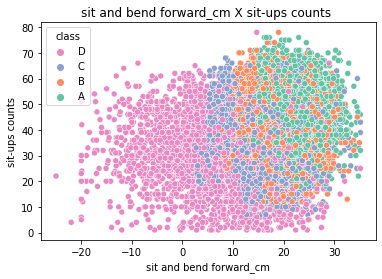

              precision    recall  f1-score   support

           A       0.59      0.71      0.64      1012
           B       0.37      0.41      0.39       958
           C       0.49      0.41      0.45      1021
           D       0.75      0.66      0.70      1002

    accuracy                           0.55      3993
   macro avg       0.55      0.55      0.55      3993
weighted avg       0.55      0.55      0.55      3993



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but GaussianNB was fitted with feature names



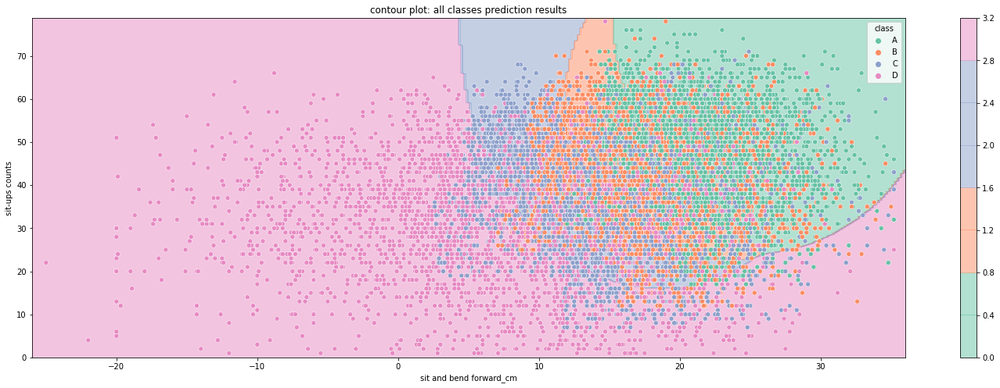

In [116]:
bayes_plot(pd.concat([X_bodyPerformance_numeric,y_bodyPerformance_numeric],axis=1),spread=1)


## **2) Decision Tree**

a- on source data <br>
b- on manipulated data

In [117]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import classification_report
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz

In [118]:
def createDecisionTree(X_features,Y_target,criterion,isAll,max_depth=None,min_impurity_decrease=0.0,max_leaf_nodes=None,min_samples_split=2):
  """ function get feature and classification col , isAll param- true if we want all features and more params to improve tree, and: create model,make prediction and show classification report"""
  # Dividing to train and test groups .
  X_train, X_test, Y_train, Y_test = train_test_split(X_features, Y_target,test_size=0.3,random_state=1)

  # 1 define model
  clf = DecisionTreeClassifier(criterion=criterion,random_state = 1,max_depth=max_depth,min_impurity_decrease=min_impurity_decrease,max_leaf_nodes =max_leaf_nodes,min_samples_split=min_samples_split)

  # 2 create model with train group
  clf.fit(X_train, Y_train)

  # 3 prediction
  y_pred = clf.predict(X_test)

  # 4 print heatmap classification report
  classes=["A","B","C","D"]
  clf_report =classification_report(Y_test,y_pred,target_names=classes, output_dict=True)

  if isAll:
    sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True).set_title('Classification Report - Decision Tree with all features')
  else:
    sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True).set_title('Classification Report - Decision Tree')
  return clf

### a) Baseline decision tree - source data , all features

* DF withoout classfication col to numeric

In [119]:
bodyPerformance_numeric_Source = to_numeric(bodyPerformanceSource.copy())

* create two groups: for features and for class col

In [120]:
X_bodyPerformance_numeric_Source = bodyPerformance_numeric_Source.drop(['class'], axis=1)
y_bodyPerformance_numeric_Source = bodyPerformance_numeric_Source['class']

* create tree from all features

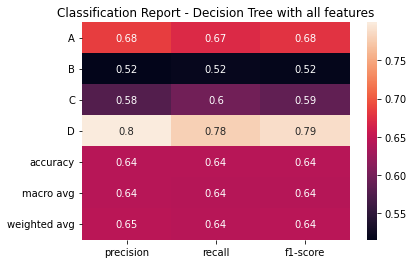

In [121]:
_ = createDecisionTree(X_bodyPerformance_numeric_Source,y_bodyPerformance_numeric_Source,"entropy",True)

### b) decision tree- choose most relevent features

1.  In order to calculate importance of all the features : i create tree from all features on the manipulated data

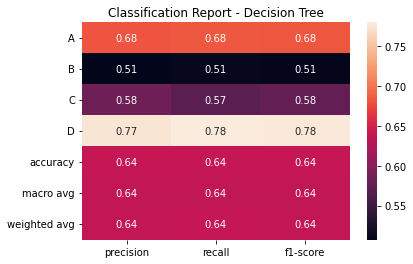

In [122]:
bodyPerformance_numeric_manipulated= to_numeric(bodyPerformance.copy())
bodyPerformance_numeric_manipulated.head(10)

X_bodyPerformance_numeric_manipulated = bodyPerformance_numeric_manipulated.drop(['class'], axis=1)
y_bodyPerformance_numeric_manipulated= bodyPerformance_numeric_manipulated['class']

clf=createDecisionTree(X_bodyPerformance_numeric_manipulated,y_bodyPerformance_numeric_manipulated,"entropy",False)

2. calculate importance

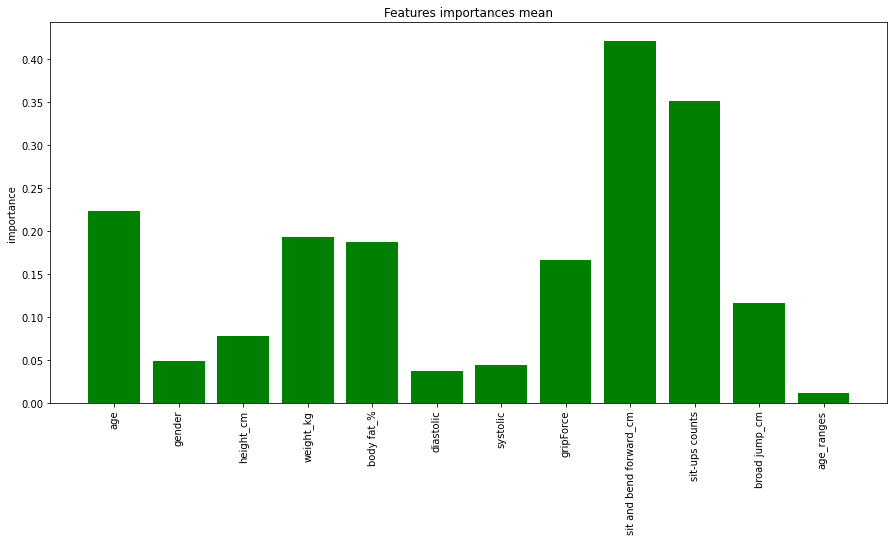

In [124]:
from sklearn.inspection import permutation_importance
result = permutation_importance(clf, X_bodyPerformance_numeric_manipulated, y_bodyPerformance_numeric_manipulated, n_repeats=10,random_state=1)

fig = plt.figure(figsize=(15, 7))
plt.bar(range(len(X_bodyPerformance_numeric_manipulated.columns)), result['importances_mean'],color="green")
plt.xticks(ticks=range(len(X_bodyPerformance_numeric_manipulated.columns)),labels=X_bodyPerformance_numeric_manipulated.columns, rotation=90)
plt.ylabel('importance') 
plt.title('Features importances mean')
plt.show()

3. create tree from  2 features : sit and bend forward_cm ,sit-ups count 

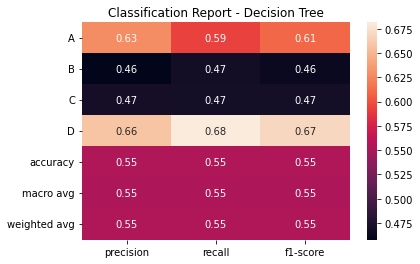

In [126]:
bodyPerformance_numeric_manipulated= to_numeric(bodyPerformance.copy())

X_bodyPerformance_numeric_manipulated_3features = bodyPerformance_numeric_manipulated.filter(['sit and bend forward_cm','sit-ups counts','age'], axis=1)
y_bodyPerformance_numeric_manipulated_3features= bodyPerformance_numeric_manipulated['class']


clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_3features,y_bodyPerformance_numeric_manipulated_3features,"entropy",False)

**try to improve 1 : create tree from 4 important features instead of 3**

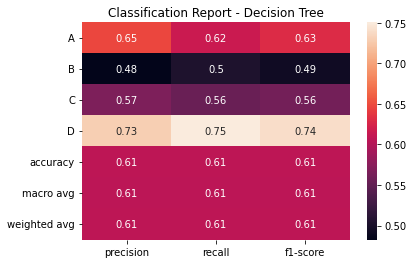

In [127]:
X_bodyPerformance_numeric_manipulated_4features = bodyPerformance_numeric_manipulated.filter(['sit and bend forward_cm','sit-ups counts','age','weight_kg'], axis=1)
y_bodyPerformance_numeric_manipulated_4features= bodyPerformance_numeric_manipulated['class']

clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features,"entropy",False)

**try to improve 2 : check max_depth**

In [128]:
def check_depth_plot(x,y):
  """get x:features with their data and y: targat col and show graph that represent depth X accuracy"""
  max_depth_range = list(range(1, 17))
  X_train, X_test, Y_train, Y_test = train_test_split(x, y,test_size=0.3,random_state=1)
  accuracy = []

  for depth in max_depth_range: 
      clf = DecisionTreeClassifier(max_depth = depth, 
                              criterion="entropy",random_state=1)
      clf.fit(X_train, Y_train)
      score = clf.score(X_test, Y_test)
      accuracy.append(score)

  %matplotlib inline
  ind = range(len(accuracy))+ np.ones(len(accuracy))
  sns.set_theme(font_scale=1.5, style="darkgrid")
  g=sns.relplot(x=ind, y=accuracy, kind="line",color="green")
  g.fig.subplots_adjust(top=0.9,left=0.1)
  g.fig.suptitle('depth X accuracy - decision tree')
  g.axes[0,0].set_xlabel('depth')
  g.axes[0,0].set_ylabel('accuracy')


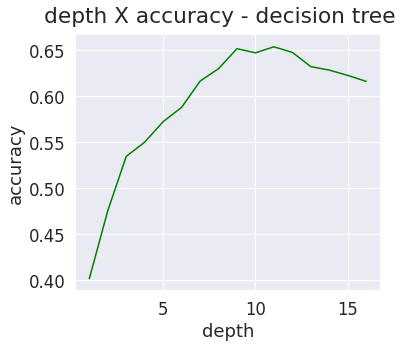

In [129]:
check_depth_plot(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features)

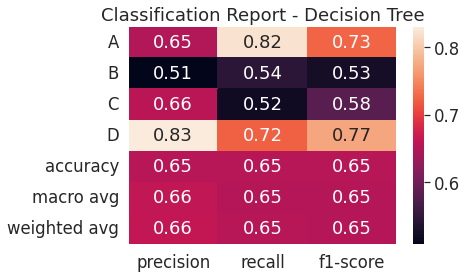

In [130]:
clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features,"entropy",False,max_depth=11)


**try to improve 3 : define- max_leaf_nodes**


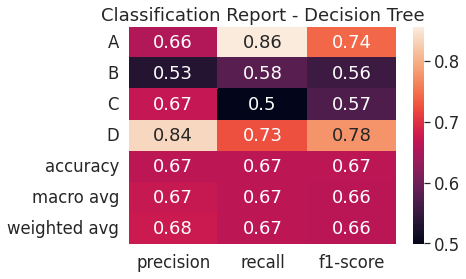

In [131]:
clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features,"entropy",False,max_leaf_nodes=185)

**try to improve 4 : define- min_samples_split**

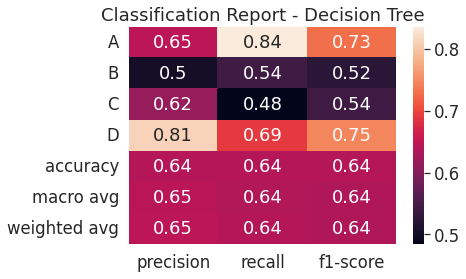

In [132]:
clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features,"entropy",False,min_samples_split=0.01)

* try to improve 5 : define- min_samples_split

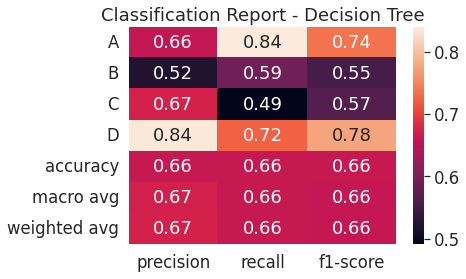

In [133]:
clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features,"entropy",False,min_impurity_decrease=0.001)

Print final tree:

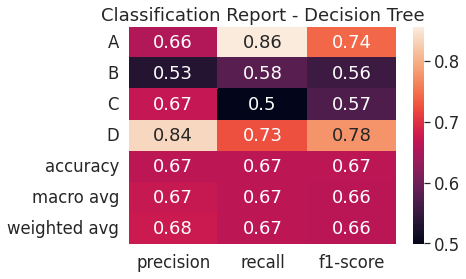

In [134]:
clf=createDecisionTree(X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features,"entropy",False,max_leaf_nodes=185)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



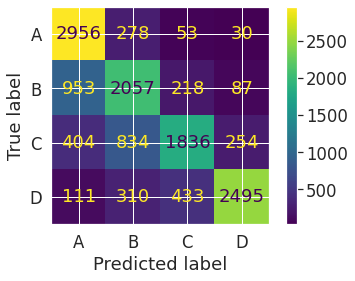

In [135]:
from sklearn.metrics import plot_confusion_matrix 
y_pred=clf.predict(X_bodyPerformance_numeric_manipulated_4features)
plot_confusion_matrix(clf,X_bodyPerformance_numeric_manipulated_4features,y_bodyPerformance_numeric_manipulated_4features)

print tree:

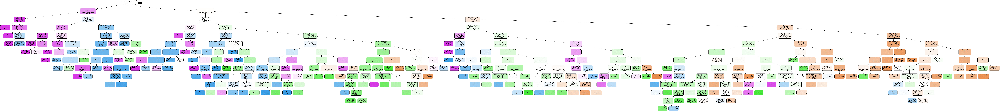

In [136]:

dot_data=StringIO()
export_graphviz(clf,out_file=dot_data,filled=True,rounded=True,feature_names=X_bodyPerformance_numeric_manipulated_4features.columns,class_names=clf.classes_)
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('final_tree.png')
Image(graph.create_png())